**Importing necessary libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

**Importing the dataset**

In [2]:
file_id = '1Hj-PUnOmNyy0pcjLrvf8mOM18LV3zPpW'
file_url = f'https://drive.google.com/uc?id={file_id}'
data = pd.read_csv(file_url)

Displaying Data

In [3]:
data

,NAME,GENDER,DRUG NAME,AGE,RACE,SIDE EFFECTS
0,Aaban,M,topamax,41.0,White,Mild Side Effects
1,Aaban,M,zocor,53.0,"Hispanic, White",Extremely Severe Side Effects
2,Aabha,F,tazorac,31.0,White,Mild Side Effects
3,Aabha,F,voltaren,44.0,White,Severe Side Effects
4,Aabid,M,tramadol,24.0,White,No Side Effects
...,...,...,...,...,...,...
399995,TRUE,M,lamisil,50.0,White,Severe Side Effects
399996,TRUE,M,klaron,55.0,"Hispanic, White",No Side Effects
399997,TRUE,M,celexa,57.0,Other,Severe Side Effects
399998,TRUE,F,zoloft,59.0,White,No Side Effects


**Exploratory Data Analysis(EDA)**

In [4]:
data.head()

,NAME,GENDER,DRUG NAME,AGE,RACE,SIDE EFFECTS
0,Aaban,M,topamax,41.0,White,Mild Side Effects
1,Aaban,M,zocor,53.0,"Hispanic, White",Extremely Severe Side Effects
2,Aabha,F,tazorac,31.0,White,Mild Side Effects
3,Aabha,F,voltaren,44.0,White,Severe Side Effects
4,Aabid,M,tramadol,24.0,White,No Side Effects


In [5]:
data.shape

(400000, 6)

In [6]:
data.columns

Index(['NAME', 'GENDER', 'DRUG NAME', 'AGE', 'RACE', 'SIDE EFFECTS'], dtype='object')

Duplicate Values

In [7]:
data.duplicated().value_counts()

False    398208
True       1792
dtype: int64

Percentage of duplicate values

In [8]:
data.duplicated().value_counts(normalize=True)

False    0.99552
True     0.00448
dtype: float64

In [9]:
# Use the drop_duplicates method to remove duplicate rows as it is less than 1%
data = data.drop_duplicates()

In [10]:
data.shape

(398208, 6)

In [11]:
data['NAME'].nunique()

133911

In [12]:
data['GENDER'].nunique()

2

In [13]:
data['DRUG NAME'].nunique()

502

In [14]:
data['AGE'].nunique()

80

In [15]:
data['RACE'].nunique()

9

In [16]:
data['SIDE EFFECTS'].nunique()

5

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 398208 entries, 0 to 399999
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   NAME          398208 non-null  object 
 1   GENDER        398208 non-null  object 
 2   DRUG NAME     398208 non-null  object 
 3   AGE           398188 non-null  float64
 4   RACE          398208 non-null  object 
 5   SIDE EFFECTS  398208 non-null  object 
dtypes: float64(1), object(5)
memory usage: 21.3+ MB


In [18]:
data.dtypes

NAME             object
GENDER           object
DRUG NAME        object
AGE             float64
RACE             object
SIDE EFFECTS     object
dtype: object

In [19]:
data.describe()

,AGE
count,398188.000000
mean,41.466430
std,12.550886
min,14.000000
25%,31.000000
50%,41.000000
75%,51.000000
max,600.000000


In [20]:
data['NAME'].unique()

array(['Aaban', 'Aabha', 'Aabid', ..., 'Zyyon', 'Zzyzx', 'TRUE'],
      dtype=object)

In [21]:
data['GENDER'].unique()

array(['M', 'F'], dtype=object)

In [22]:
data['DRUG NAME'].unique()

array(['topamax', 'zocor', 'tazorac', 'voltaren', 'tramadol', 'valtrex',
       'levoxyl', 'imitrex', 'seroquel', 'minocycline', 'proscar',
       'keflex', 'cataflam', 'zyrtec', 'lexapro', 'spironolactone',
       'claripel-cream', 'wellbutrin-sr', 'prozac', 'wellbutrin-xl',
       'citalopram', 'baclofen', 'concerta', 'singulair', 'angeliq',
       'yasmin', 'cialis', 'lunesta', 'cymbalta', 'methotrexate',
       'lamictal', 'evoclin', 'actonel', 'protonix', 'premarin',
       'provigil', 'protopic', 'prednisone', 'diazepam', 'ultram',
       'albuterol', 'zovirax', 'asacol', 'zegerid', 'halcion', 'differin',
       'nexium', 'phenergan', 'propecia', 'enalapril', 'chantix', 'avita',
       'synthroid', 'renova', 'buspar', 'retin-a-micro', 'climara',
       'estrace', 'klonopin', 'ambien', 'prevacid', 'lipitor',
       'wellbutrin', 'seasonique', 'paxil', 'nortriptyline', 'amoxil',
       'nitrofurantoin', 'tamiflu', 'noroxin', 'acyclovir', 'aromasin',
       'celebrex', 'claritin', '

In [23]:
data['RACE'].unique()

array(['White', 'Hispanic, White', 'Unknown', 'Black', 'Other',
       'Hispanic, Black', 'Asian, Other', 'Asian Indian', 'Chinese'],
      dtype=object)

In [24]:
data['AGE'].unique()

array([ 41.,  53.,  31.,  44.,  24.,  55.,  34.,  28.,  38.,  56.,  18.,
        35.,  50.,  52.,  62.,  42.,  23.,  40.,  22.,  32.,  39.,  51.,
        29.,  43.,  57.,  26.,  60.,  36.,  54.,  70.,  37.,  30.,  65.,
        47.,  33.,  58.,  25.,  49.,  46.,  48.,  59.,  71.,  63.,  45.,
        67.,  21.,  27.,  17.,  20.,  66.,  61.,  64.,  15.,  69.,  19.,
       300.,  73.,  68.,  72.,  74.,  75.,  14.,  nan, 302.,  87.,  90.,
        84.,  80., 500., 400., 203., 160., 191., 450., 390.,  77., 155.,
       600., 211., 401.,  89.])

In [25]:
data['SIDE EFFECTS'].unique()

array(['Mild Side Effects', 'Extremely Severe Side Effects',
       'Severe Side Effects', 'No Side Effects', 'Moderate Side Effects'],
      dtype=object)

Finding number of missing values

In [26]:
data.isna().sum()

NAME             0
GENDER           0
DRUG NAME        0
AGE             20
RACE             0
SIDE EFFECTS     0
dtype: int64

#There are missing values in the AGE.

**UNIVARIATE** **ANALYSIS**

In [27]:
#NAME

In [28]:
#Drop the column "Name" which doesn't give any contribution for the modelling
data = data.drop(['NAME'], axis = 1)

In [29]:
data

,GENDER,DRUG NAME,AGE,RACE,SIDE EFFECTS
0,M,topamax,41.0,White,Mild Side Effects
1,M,zocor,53.0,"Hispanic, White",Extremely Severe Side Effects
2,F,tazorac,31.0,White,Mild Side Effects
3,F,voltaren,44.0,White,Severe Side Effects
4,M,tramadol,24.0,White,No Side Effects
...,...,...,...,...,...
399995,M,lamisil,50.0,White,Severe Side Effects
399996,M,klaron,55.0,"Hispanic, White",No Side Effects
399997,M,celexa,57.0,Other,Severe Side Effects
399998,F,zoloft,59.0,White,No Side Effects


In [30]:
#RACE

In [31]:
data['RACE'].value_counts()

White              312673
Hispanic, White     43870
Black               35693
Unknown              3032
Hispanic, Black      1658
Other                1002
Asian, Other          168
Asian Indian          104
Chinese                 8
Name: RACE, dtype: int64

In [32]:
data['RACE'].value_counts(normalize=True)

White              0.785200
Hispanic, White    0.110169
Black              0.089634
Unknown            0.007614
Hispanic, Black    0.004164
Other              0.002516
Asian, Other       0.000422
Asian Indian       0.000261
Chinese            0.000020
Name: RACE, dtype: float64

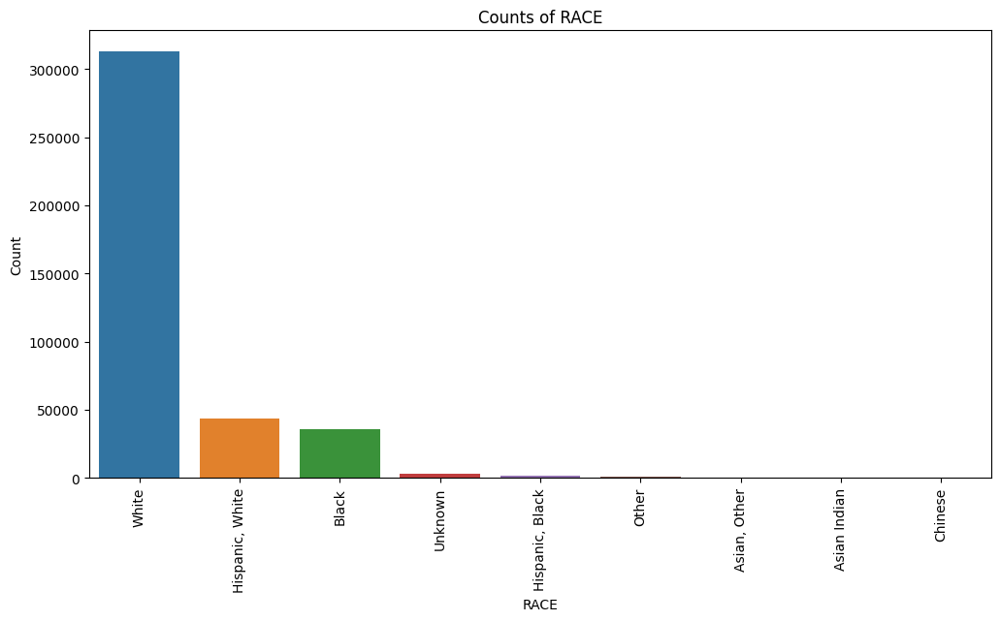

In [33]:
plt.figure(figsize=(12, 6))
sns.countplot(x='RACE', data=data, order=data['RACE'].value_counts().index)
plt.title('Counts of RACE')
plt.xlabel('RACE')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [34]:
#AMONG THE PATIENTS MAJORITY ARE WHITES AND CHINESE ARE MINORITY

In [35]:
#GENDER

In [36]:
data['GENDER'].value_counts()

F    236852
M    161356
Name: GENDER, dtype: int64

In [37]:
data['GENDER'].value_counts(normalize=True)

F    0.594795
M    0.405205
Name: GENDER, dtype: float64

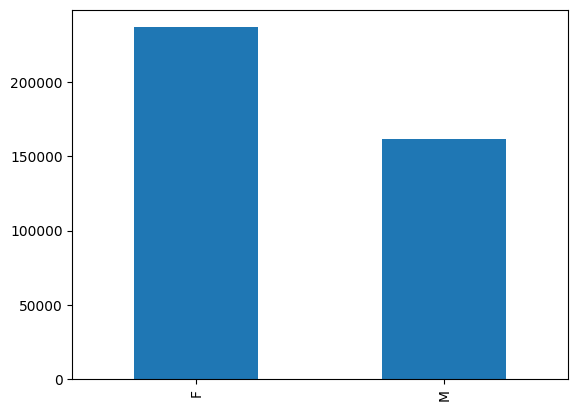

In [38]:
data['GENDER'].value_counts().plot.bar()
plt.show()

In [39]:
#females are more

In [40]:
#AGE

In [41]:
data['AGE'].min()

14.0

In [42]:
data['AGE'].max()

600.0

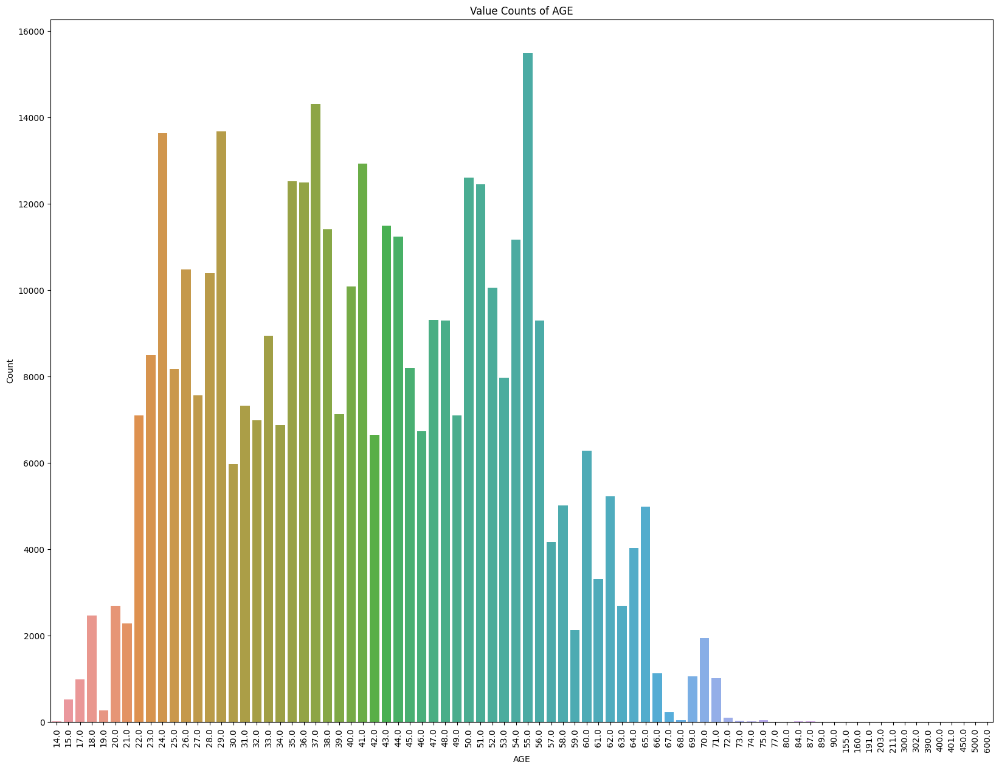

In [43]:
# Calculate value counts for 'AGE'
age_counts = data['AGE'].value_counts().sort_index()

# Create a bar plot for the value counts of 'AGE'
plt.figure(figsize=(20, 15))
sns.barplot(x=age_counts.index, y=age_counts.values)
plt.xlabel('AGE')
plt.ylabel('Count')
plt.title('Value Counts of AGE')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.show()


In [44]:
# AGE IS A SKEWED DISTRIBUTION ,AND MAJORITY PATIENTS ARE IN THE AGE GROUP OF 24-55.

In [45]:
pd.set_option('display.max_rows', None)

In [46]:
data['AGE'].value_counts()

55.0     15493
37.0     14307
29.0     13671
24.0     13640
41.0     12925
50.0     12599
35.0     12514
36.0     12488
51.0     12453
43.0     11496
38.0     11408
44.0     11237
54.0     11165
26.0     10481
28.0     10399
40.0     10079
52.0     10058
47.0      9304
56.0      9300
48.0      9289
33.0      8939
23.0      8486
45.0      8192
25.0      8165
53.0      7972
27.0      7567
31.0      7322
39.0      7130
22.0      7101
49.0      7100
32.0      6985
34.0      6872
46.0      6736
42.0      6648
60.0      6276
30.0      5977
62.0      5224
58.0      5020
65.0      4989
57.0      4175
64.0      4032
61.0      3308
63.0      2696
20.0      2683
18.0      2459
21.0      2282
59.0      2128
70.0      1945
66.0      1128
69.0      1056
71.0      1017
17.0       986
15.0       516
19.0       272
67.0       218
72.0        96
75.0        48
68.0        48
73.0        32
87.0         9
74.0         8
84.0         8
14.0         8
300.0        3
390.0        3
600.0        2
400.0     

In [47]:
#SIDE EFFECTS

In [48]:
data['SIDE EFFECTS'].value_counts()

Mild Side Effects                132667
No Side Effects                  115247
Moderate Side Effects             74166
Severe Side Effects               53194
Extremely Severe Side Effects     22934
Name: SIDE EFFECTS, dtype: int64

In [49]:
data['SIDE EFFECTS'].value_counts(normalize=True)

Mild Side Effects                0.333160
No Side Effects                  0.289414
Moderate Side Effects            0.186249
Severe Side Effects              0.133583
Extremely Severe Side Effects    0.057593
Name: SIDE EFFECTS, dtype: float64

**This shows the target feature is imbalanced**

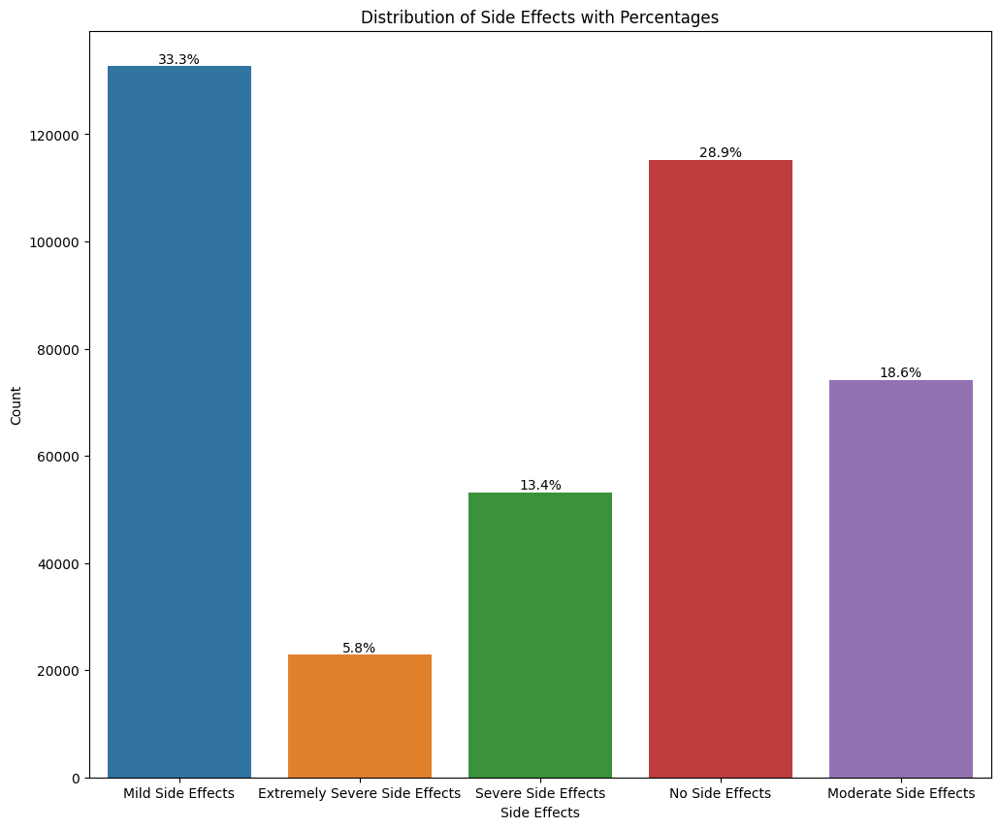

In [50]:
plt.figure(figsize=(12, 10))
ax = sns.countplot(x='SIDE EFFECTS', data=data)

# Annotate percentages above the bars
total = len(data)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height/total:.1%}', (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom')

# Set labels and title
plt.xlabel('Side Effects')
plt.ylabel('Count')
plt.title('Distribution of Side Effects with Percentages')

plt.show()

PATIENTS WITH MILD EFFECTS  ARE THE 33.3%, PEOPLE WITH EXTREME SIDE EFFECTS ARE 5.8 % OF TOTAL PATIENTS

In [51]:
#DRUG NAME

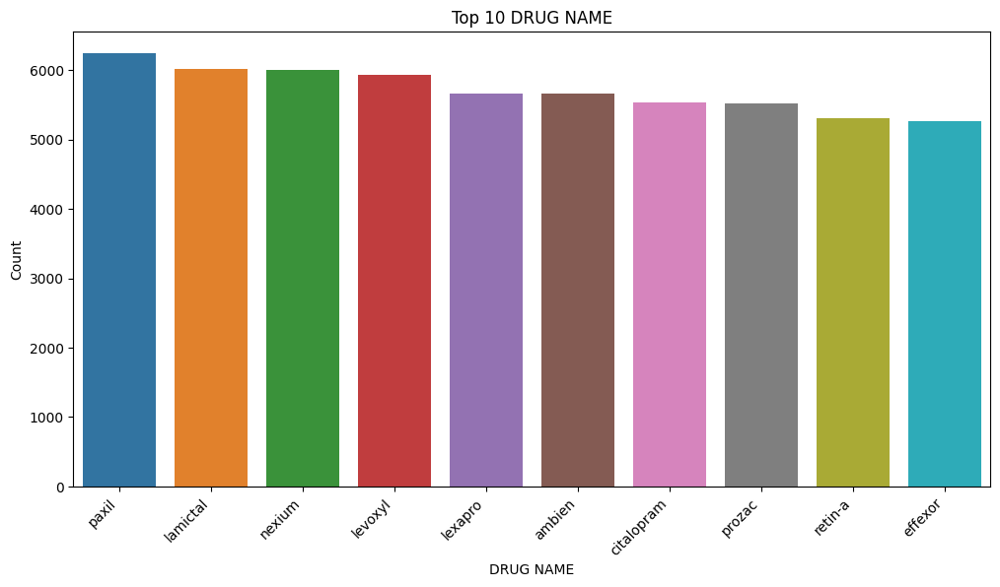

In [52]:
top_n = 10  # Choose the number of top drugs to display

# Get the top N drugs
top_drugs = data['DRUG NAME'].value_counts().head(top_n)

# Create a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=top_drugs.index, y=top_drugs.values)
plt.title(f'Top {top_n} DRUG NAME')
plt.xlabel('DRUG NAME')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()


In [53]:
pd.set_option('display.max_rows', None)

In [54]:
data['DRUG NAME'].value_counts()


paxil                            6243
lamictal                         6015
nexium                           6001
levoxyl                          5927
lexapro                          5667
ambien                           5662
citalopram                       5536
prozac                           5514
retin-a                          5311
effexor                          5258
chantix                          5163
differin                         5128
provigil                         5032
topamax                          4602
augmentin                        4511
neurontin                        4210
ultram                           4021
amoxil                           3970
propecia                         3958
synthroid                        3831
retin-a-micro                    3696
doxycycline                      3680
elavil                           3576
metrogel                         3493
seroquel                         3289
wellbutrin                       3283
wellbutrin-x

In [55]:
#THE PLOT SHOWS THE TOP 10 DRUGS USED BY PATIENTS AND PAXIL TOPS THE LIST

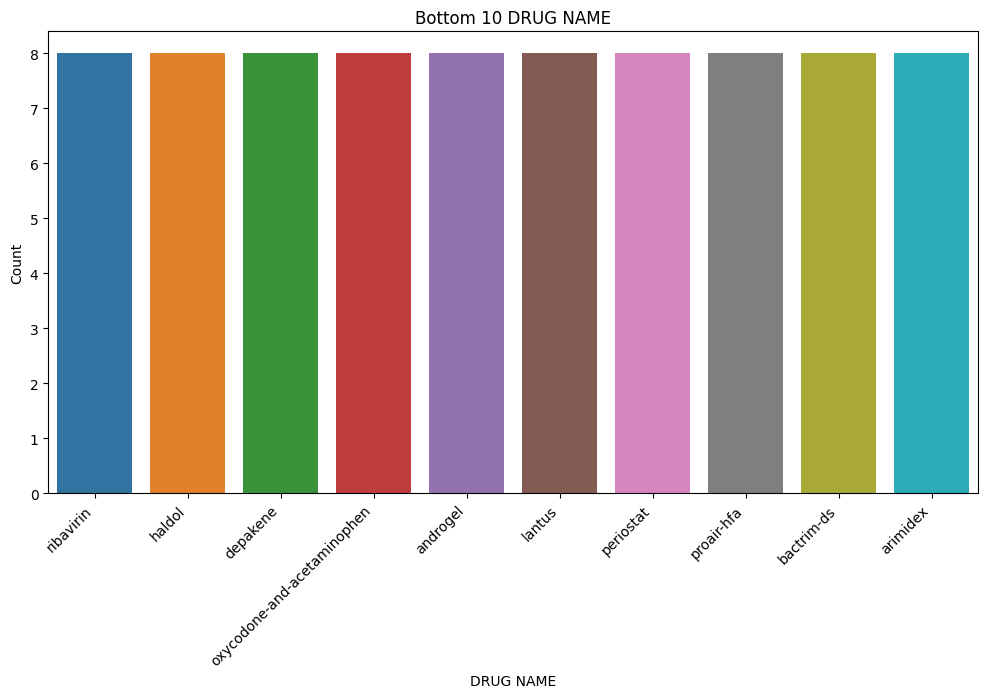

In [56]:
bottom_n = 10  # Choose the number of bottom drugs to display

# Get the bottom N drugs
bottom_drugs = data['DRUG NAME'].value_counts().tail(bottom_n)

# Create a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=bottom_drugs.index, y=bottom_drugs.values)
plt.title(f'Bottom {bottom_n} DRUG NAME')
plt.xlabel('DRUG NAME')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()


In [57]:
drug_counts = data['DRUG NAME'].value_counts()
drug_names_with_8_counts = drug_counts[drug_counts == 8].index.tolist()
drug_names_with_8_counts


['rifadin',
 'bisoprolol',
 'zyvox',
 'arthrotec',
 'dapsone',
 'lybrel',
 'risperdal-consta',
 'pamelor',
 'vesicare',
 'inspra',
 'progesterone',
 'metformin-extended-release',
 'vigamox',
 'vistaril',
 'levetiracetam',
 'erythra-derm',
 'estring',
 'tapazole',
 'bactroban',
 'cardura',
 'amerge',
 'baciim',
 'asmanex',
 'femara',
 'accolate',
 'detrol',
 'warfarin',
 'glucophage-xr',
 'vicoprofen',
 'sanctura-xr',
 'kenalog',
 'nardil',
 'pepcid',
 'nasacort-aq',
 'lotronex',
 'bystolic',
 'cefzil',
 'azor',
 'zovirax-topical',
 'omacor',
 'proloprim',
 'quibron-t',
 'lidocaine',
 'lodine',
 'estrostep-fe',
 'ziac',
 'nizoral',
 'diltiazem',
 'corgard',
 'lac-hydrin',
 'cardura-xl',
 'fentanyl',
 'benicar-hct',
 'azasan',
 'locoid-lipocream',
 'hydrocodone-and-acetaminophen',
 'atripla',
 'penicillin-v',
 'prochlorperazine',
 'betaseron',
 'tofranil-pm',
 'lidex',
 'enablex',
 'vioxx',
 'meperidine',
 'polymyxin-b',
 'nizoral-shampoo',
 'penlac',
 'trilipix',
 'dicyclomine',
 'deson

In [58]:
len(drug_names_with_8_counts)

101

In [59]:
#THE ABOVE CODE SHOWS THAT 101 DRUGS ARE LEAST PREFERRED

**BIVARIATE ANALYSIS**

In [60]:
#GENDER VS AGE

GENDER      F      M
AGE                 
10-14     304    220
15-19    3793   2607
20-24   23612  16062
25-29   28693  19402
30-34   25452  17180
35-39   32937  22475
40-44   30051  20447
45-49   26713  18315
50-54   34014  23127
55-59   15905  10994
60-64   12033   8216
65-69    2608   1787
70-74     705    496
75+         1      1


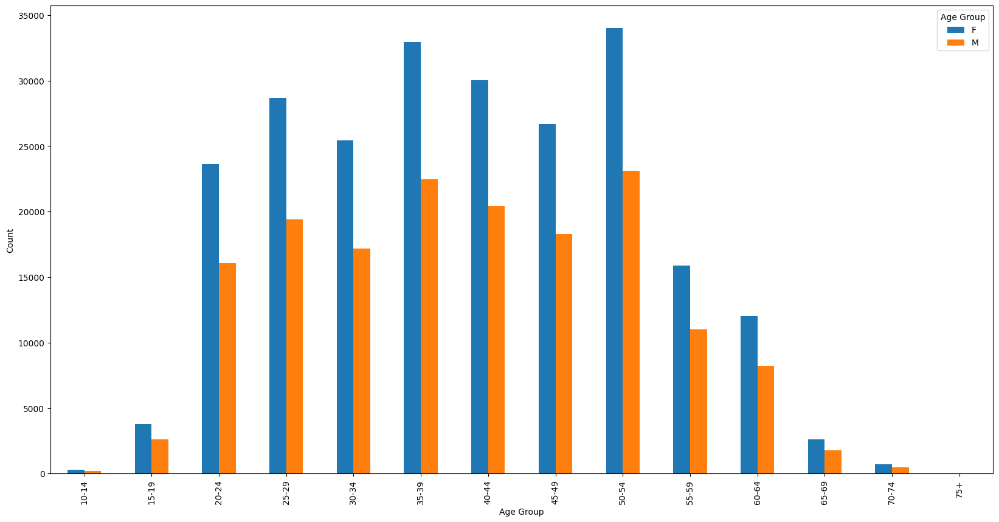

In [61]:
age_groups = ['0-4', '5-9', '10-14', '15-19', '20-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75+']

# Create a contingency table with age groups
contingency_table = pd.crosstab(pd.cut(data['AGE'], bins=range(0, 81, 5), labels=age_groups), data['GENDER'])

print(contingency_table)

# Plot the contingency table
contingency_table.plot(kind='bar', figsize=(20, 10))
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.legend(title='Age Group')
plt.show()

In [62]:
#MAJORITY PATIENTS ARE IN THE AGE GROUP OF 20-59, AND OUT OF THAT TOO FEMALES ARE HIGHER THAN MALES IN ALL GROUPS

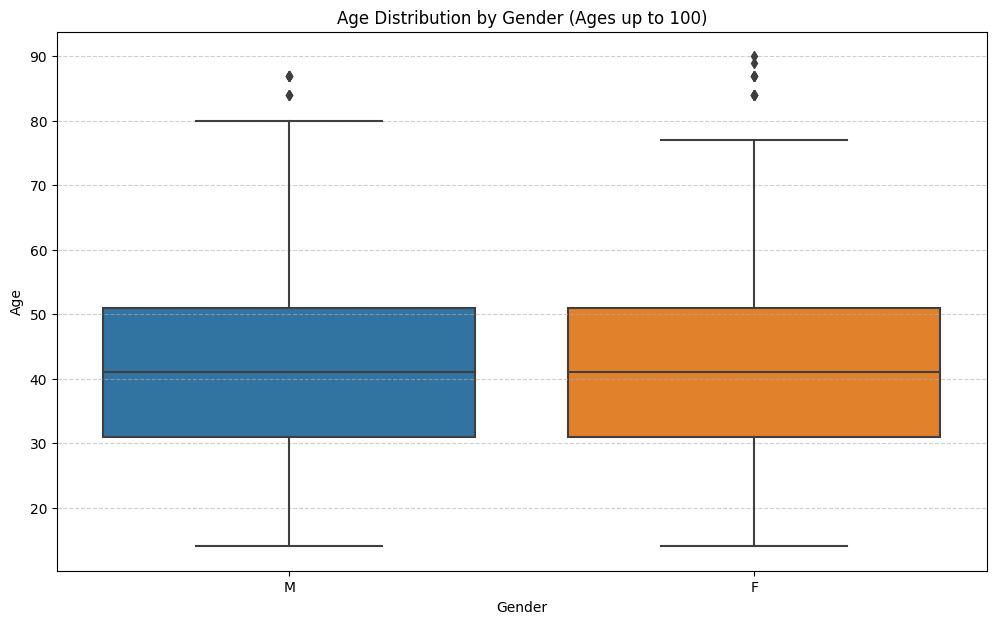

In [63]:
# Filter the data to include ages up to 100
data_filtered = data[data['AGE'] <= 100]

plt.figure(figsize=(12, 7))
sns.boxplot(x='GENDER', y='AGE', data=data_filtered)
plt.xlabel('Gender')
plt.ylabel('Age')
plt.title('Age Distribution by Gender (Ages up to 100)')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()


In [64]:
#IRRESPECTIVE OF GENDER PEOPLE OF SAME AGE ARE SUFFERING FROM ILLNESS

In [65]:
#GENDER VS SIDE EFFECTS

In [66]:
contingency_table = pd.crosstab(data['GENDER'], data['SIDE EFFECTS'], margins=True, margins_name='Total')


In [67]:
contingency_table

SIDE EFFECTS,Extremely Severe Side Effects,Mild Side Effects,Moderate Side Effects,No Side Effects,Severe Side Effects,Total
GENDER,,,,,,
F,13647,78867,44048,68554,31736,236852
M,9287,53800,30118,46693,21458,161356
Total,22934,132667,74166,115247,53194,398208


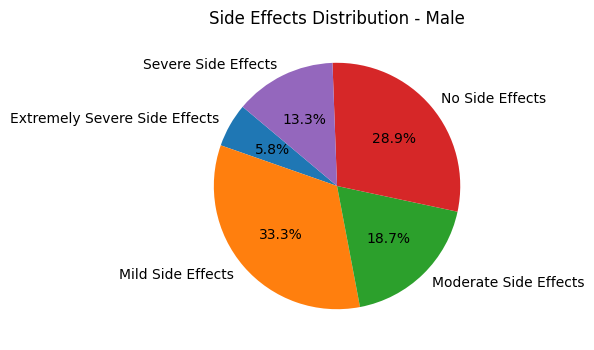

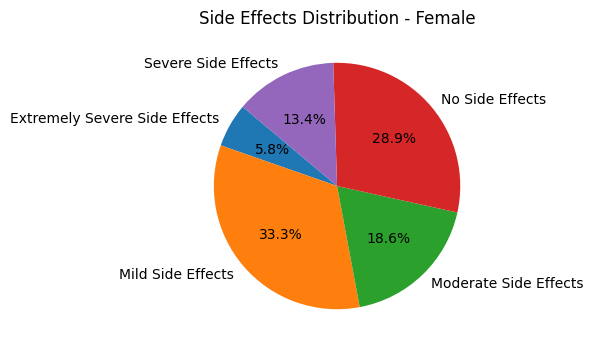

In [68]:

contingency_table = pd.crosstab(data['GENDER'], data['SIDE EFFECTS'], margins=True, margins_name='Total')

# Separate contingency table for Male and Female
male_table = contingency_table.loc['M']
female_table = contingency_table.loc['F']

# Calculate percentages for Male and Female
male_percentages = male_table / male_table['Total'] * 100
female_percentages = female_table / female_table['Total'] * 100

# Plot pie chart for Male
plt.figure(figsize=(8, 4))
plt.pie(male_percentages[:-1], labels=male_percentages.index[:-1], autopct='%1.1f%%', startangle=140)
plt.title("Side Effects Distribution - Male")
plt.show()

# Plot pie chart for Female
plt.figure(figsize=(8, 4))
plt.pie(female_percentages[:-1], labels=female_percentages.index[:-1], autopct='%1.1f%%', startangle=140)
plt.title("Side Effects Distribution - Female")
plt.show()


In [69]:
# IRRESPECTIVE OF THE GENDER ,PATIENTS WITH MILD SIDE EFFECTS ARE MAX, AND THOSE WITH EXTREME SEVERE SIDE EFFECTS ARE MIN.

In [70]:
#GENDER VS RACE

In [71]:

contingency_table = pd.crosstab(data['GENDER'], data['RACE'], margins=True, margins_name='Total')


In [72]:
contingency_table

RACE,Asian Indian,"Asian, Other",Black,Chinese,"Hispanic, Black","Hispanic, White",Other,Unknown,White,Total
GENDER,,,,,,,,,,
F,60,99,21217,5,976,26239,589,1814,185853,236852
M,44,69,14476,3,682,17631,413,1218,126820,161356
Total,104,168,35693,8,1658,43870,1002,3032,312673,398208


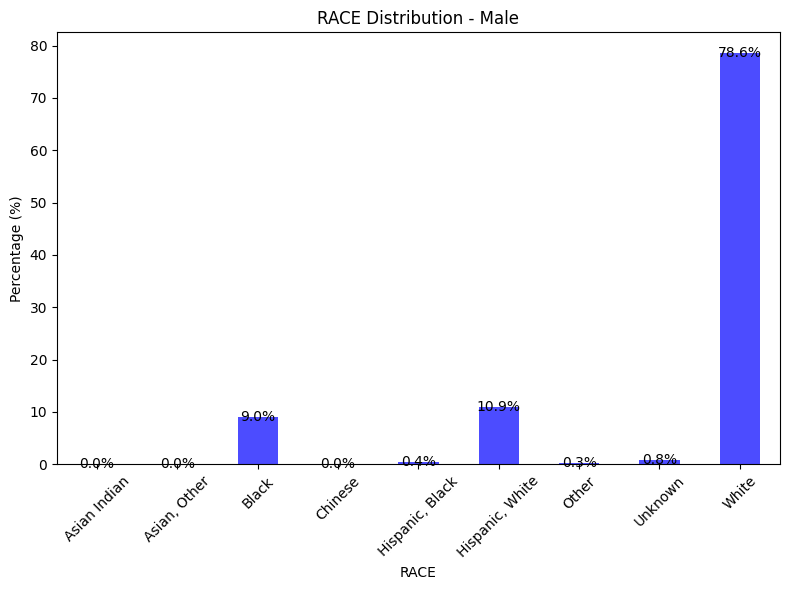

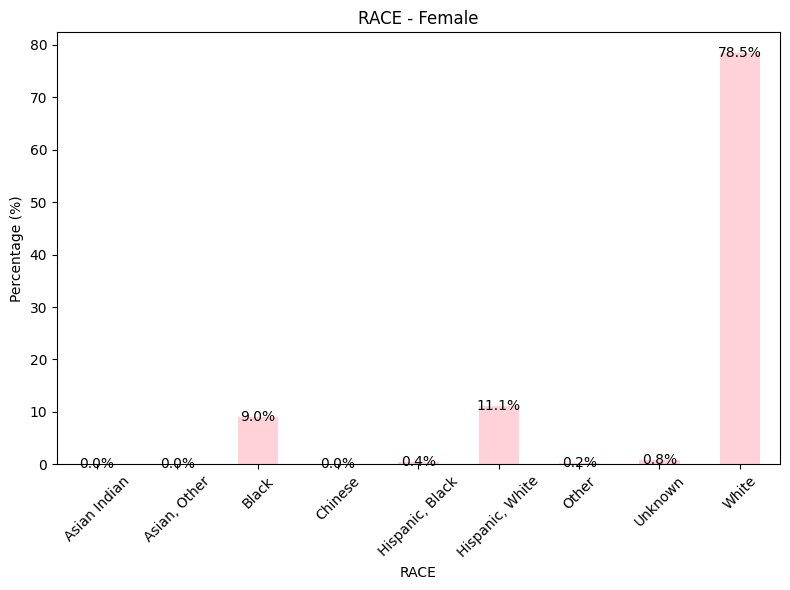

In [73]:

contingency_table = pd.crosstab(data['GENDER'], data['RACE'], margins=True, margins_name='Total')

# Separate contingency table for Male and Female
male_table = contingency_table.loc['M']
female_table = contingency_table.loc['F']

# Calculate percentages for Male and Female
male_percentages = (male_table / male_table['Total'])[:-1] * 100
female_percentages = (female_table / female_table['Total'])[:-1] * 100

# Plot bar chart for Male
plt.figure(figsize=(8, 6))
ax = male_percentages.plot(kind='bar', color='blue', alpha=0.7)
plt.title("RACE Distribution - Male")
plt.xlabel("RACE")
plt.ylabel("Percentage (%)")
plt.xticks(rotation=45)
plt.tight_layout()

# Add percentages above the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center')

plt.show()

# Plot bar chart for Female
plt.figure(figsize=(8, 6))
ax = female_percentages.plot(kind='bar', color='pink', alpha=0.7)
plt.title("RACE - Female")
plt.xlabel("RACE")
plt.ylabel("Percentage (%)")
plt.xticks(rotation=45)
plt.tight_layout()

# Add percentages above the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center')

plt.show()


In [74]:
# MOJORITY PATIENTS ARE WHITES ,CHINESE ARE MINORITY

In [75]:
#GENDER VS DRUG NAME

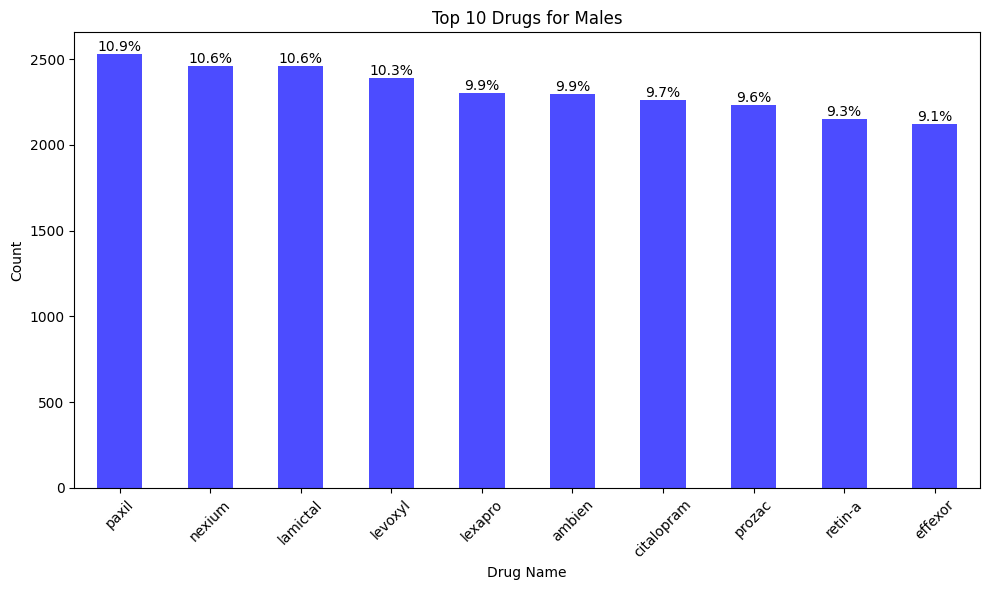

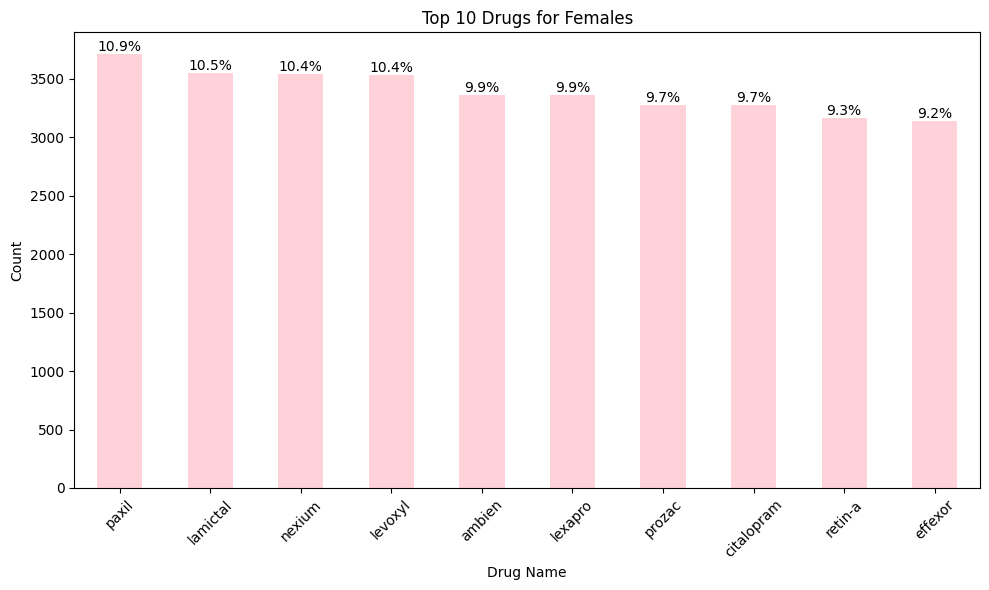

In [76]:
contingency_table = pd.crosstab(data['GENDER'], data['DRUG NAME'], margins=True, margins_name='Total')

# Separate contingency table for Male and Female
male_table = contingency_table.loc['M']
female_table = contingency_table.loc['F']

# Remove the 'Total' column and sort by the counts in descending order
male_top_10 = male_table.drop('Total').sort_values(ascending=False).head(10)
female_top_10 = female_table.drop('Total').sort_values(ascending=False).head(10)
# Plot bar chart for Male with percentages
plt.figure(figsize=(10, 6))
ax = male_top_10.plot(kind='bar', color='blue', alpha=0.7)
plt.title("Top 10 Drugs for Males")
plt.xlabel("Drug Name")
plt.ylabel("Count")
plt.xticks(rotation=45)

# Annotate percentages above the bars
total_male = male_top_10.sum()
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height/total_male:.1%}', (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom')

plt.tight_layout()
plt.show()
# Plot bar chart for Female with percentages
plt.figure(figsize=(10, 6))
ax = female_top_10.plot(kind='bar', color='pink', alpha=0.7)
plt.title("Top 10 Drugs for Females")
plt.xlabel("Drug Name")
plt.ylabel("Count")
plt.xticks(rotation=45)
# Annotate percentages above the bars
total_female = female_top_10.sum()
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height/total_female:.1%}', (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [77]:
#TOP 10 DRUGS USED BY MALES AND FEMALES ARE SAME , THIS INDICATES BOTH HAVE SIMILAR HEALTH ISSUES ,mostly they are affected by depression or mental health issues

In [78]:
#DRUG NAME VS AGE

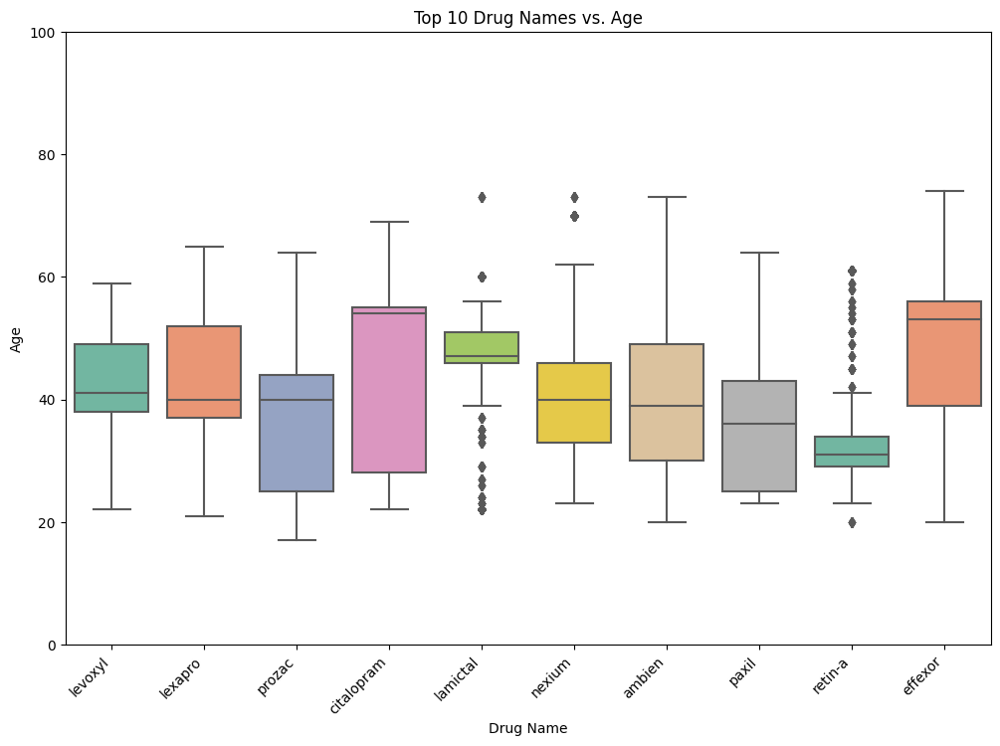

In [79]:
# Get the top 10 drug names
top_n = 10
top_drugs = data['DRUG NAME'].value_counts().head(top_n).index

# Filter the data to include only the top 10 drug names
filtered_data = data[data['DRUG NAME'].isin(top_drugs)]

# Create a box plot for the top 10 drug names vs. age
plt.figure(figsize=(12, 8))
sns.boxplot(x='DRUG NAME', y='AGE', data=filtered_data, palette='Set2')
plt.xlabel('Drug Name')
plt.ylabel('Age')
plt.title(f'Top {top_n} Drug Names vs. Age')
plt.xticks(rotation=45, ha='right')

# Set the y-axis limits to show ages only up to 100
plt.ylim(0, 100)

plt.show()


In [80]:
#retin-a: youngers are taking :skin conditions such as acne, wrinkles, hyperpigmentation, and rough texture.

In [81]:
#citalopram:older patients :antidepressant medication used to treat depression and certain anxiety disorders.

In [82]:
#effexor:older patients:antidepressant that is used to treat major depressive disorder, generalized anxiety disorder, and panic disorder.

In [83]:
#Lamictal (lamotrigine) is an anticonvulsant used to treat epilepsy and bipolar disorder,most of the patients are in the age group of 40 to 55. Levoxyl (levothyroxine) is a thyroid hormone replacement medication used to treat hypothyroidism.

In [84]:
# Levoxyl (levothyroxine) is a thyroid hormone replacement medication used to treat hypothyroidism.

In [85]:
#DRUG NAME VS RACE

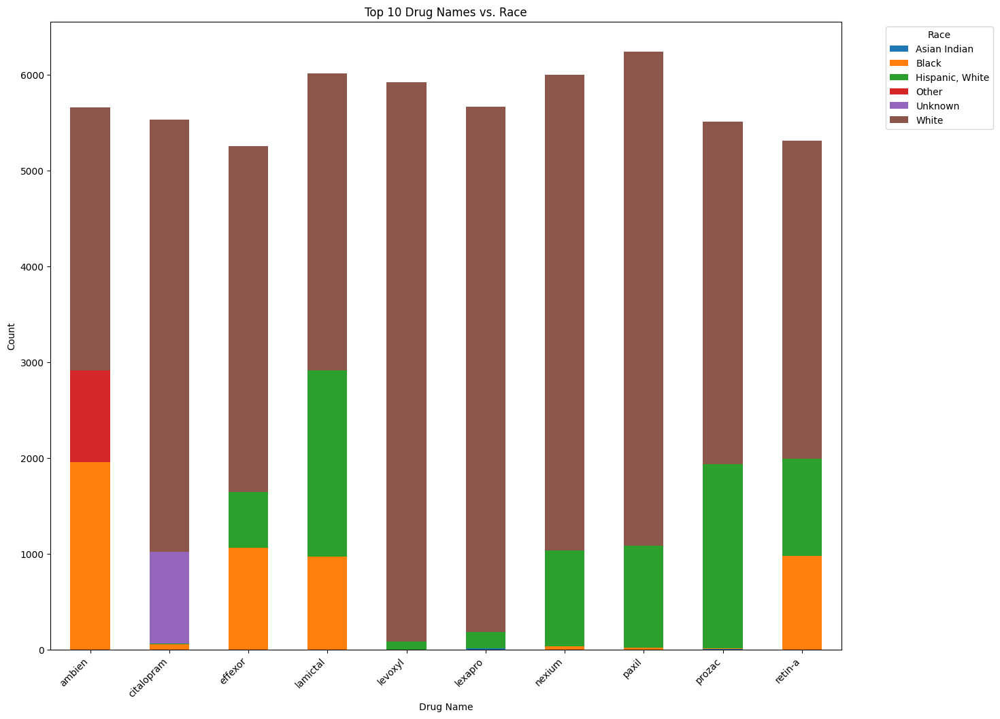

In [86]:


# Get the top 10 drug names
top_n = 10
top_drugs = data['DRUG NAME'].value_counts().head(top_n).index

# Filter the data to include only the top 10 drug names
filtered_data = data[data['DRUG NAME'].isin(top_drugs)]

# Create a DataFrame with counts of drug usage by race
drug_race_counts = filtered_data.groupby(['DRUG NAME', 'RACE']).size().unstack(fill_value=0)

# Plot a grouped bar plot
ax = drug_race_counts.plot(kind='bar', stacked=True, figsize=(15, 12))
plt.xlabel('Drug Name')
plt.ylabel('Count')
plt.title('Top 10 Drug Names vs. Race')
plt.legend(title='Race', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.show()

In [87]:


# Get the top 10 drug names
top_n = 10
top_drugs = data['DRUG NAME'].value_counts().head(top_n).index

# Filter the data to include only the top 10 drug names
filtered_data = data[data['DRUG NAME'].isin(top_drugs)]

# Create a crosstab between the filtered 'DRUG NAME' and 'RACE'
cross_tab = pd.crosstab(filtered_data['DRUG NAME'], filtered_data['RACE'])

# Display the crosstab
cross_tab

RACE,Asian Indian,Black,"Hispanic, White",Other,Unknown,White
DRUG NAME,,,,,,
ambien,0,1959,0,954,0,2749
citalopram,0,56,8,0,956,4516
effexor,0,1067,581,0,0,3610
lamictal,0,971,1948,0,0,3096
levoxyl,0,0,88,0,0,5839
lexapro,16,0,168,0,0,5483
nexium,0,32,1007,0,0,4962
paxil,0,24,1063,0,0,5156
prozac,8,8,1920,0,0,3578


In [88]:
#these top 10 drugs are generally preferred by whites ,hispanic whites and blacks ,these people suffer from depression.

In [89]:
#DRUG NAME VS SIDE EFFECTS

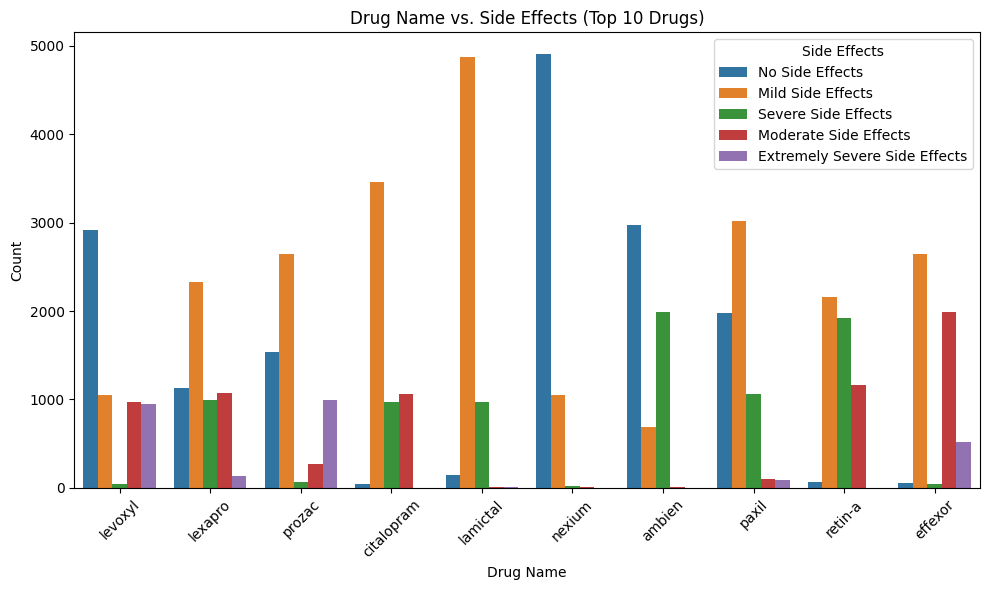

In [90]:

# Filter the DataFrame to include only the top 10 drug names
drugname_counts = data['DRUG NAME'].value_counts()
top_10_drug_names = drugname_counts.head(10).index.tolist()
filtered_df = data[data['DRUG NAME'].isin(top_10_drug_names)]

# Create a countplot for Drug Name vs. Side Effects
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
sns.countplot(x='DRUG NAME', hue='SIDE EFFECTS', data=filtered_df)

# Set the title and labels for the plot
plt.title('Drug Name vs. Side Effects (Top 10 Drugs)')
plt.xlabel('Drug Name')
plt.ylabel('Count')

# Rotate x-axis labels for better readability if needed
plt.xticks(rotation=45)

# Display the plot
plt.legend(title='Side Effects', loc='upper right')  # Add legend
plt.tight_layout()
plt.show()


In [91]:
#contingency table

In [92]:
import pandas as pd

# Assuming 'data' is your DataFrame
# Get the top 10 drug names
top_10_drugs = data['DRUG NAME'].value_counts().nlargest(10).index.tolist()

# Filter the DataFrame to include only the top 10 drugs
data_filtered = data[data['DRUG NAME'].isin(top_10_drugs)]

# Create the contingency table for top 10 drugs vs. side effects
contingency_table1 = pd.crosstab(data_filtered['DRUG NAME'], data_filtered['SIDE EFFECTS'])

print("Contingency Table for Top 10 Drug Names vs. Side Effects:")
contingency_table1


Contingency Table for Top 10 Drug Names vs. Side Effects:


SIDE EFFECTS,Extremely Severe Side Effects,Mild Side Effects,Moderate Side Effects,No Side Effects,Severe Side Effects
DRUG NAME,,,,,
ambien,0,688,16,2973,1985
citalopram,0,3460,1061,40,975
effexor,517,2644,1993,56,48
lamictal,8,4872,16,144,975
levoxyl,947,1048,972,2912,48
lexapro,136,2329,1077,1128,997
nexium,0,1056,16,4905,24
paxil,88,3017,96,1980,1062
prozac,998,2640,272,1540,64


In [93]:
#AMBIEN ,CITALOPRAM ,NEXIUM , RETIN-A ARE THE ONES HAVING NO CASE OF EXTREME SIDE EFFECTS,but all have severe side effects only nexium out of this is having least patients with severe side effects too

In [94]:
#nexium ,paxil and lamictal are the drugs which are either having very mild side effects or no side effects.

In [95]:
#AGE VS RACE

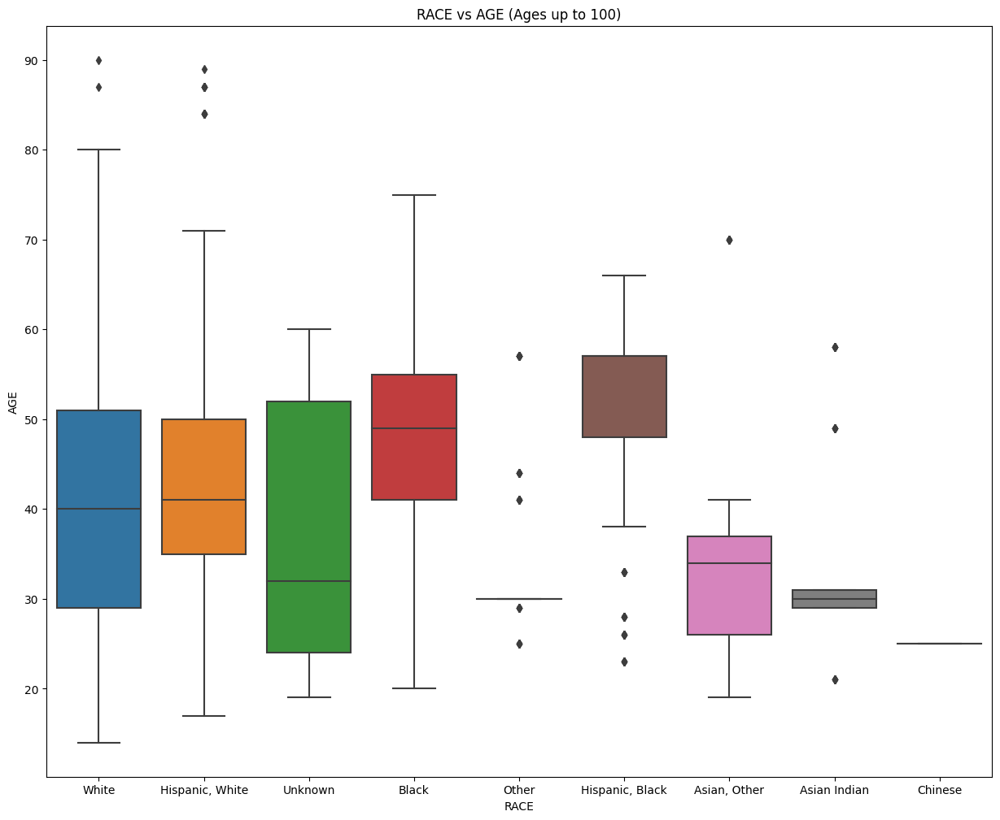

In [96]:
# Filter the data to include ages up to 100
filtered_data = data[data['AGE'] <= 100]

# Create a contingency table
contingency_table = pd.crosstab(filtered_data['AGE'], filtered_data['RACE'])
plt.figure(figsize=(15, 12))
filtered_data = data[data['AGE'] <= 100]  # Filter data for ages up to 100
sns.boxplot(x='RACE', y='AGE', data=filtered_data)
plt.title('RACE vs AGE (Ages up to 100)')
plt.show()

In [97]:
#china and asian indian have only young patients ,white ,hiSpanic white, Unknown and blacks have patients from young age to senior citizens

In [98]:
#AGE VS SIDE EFFECTS

In [99]:

# Create age bins with three groups: 0-30, 31-60, and 60 above
age_bins = pd.cut(data['AGE'], bins=[0, 30, 60, float('inf')], labels=['0-30', '31-60', '60+'])
contingency_table = pd.crosstab(age_bins, data['SIDE EFFECTS'])

# Display the contingency table
contingency_table

SIDE EFFECTS,Extremely Severe Side Effects,Mild Side Effects,Moderate Side Effects,No Side Effects,Severe Side Effects
AGE,,,,,
0-30,1974,34632,21939,26067,10081
31-60,20730,88875,46461,82553,38991
60+,228,9154,5762,6620,4121


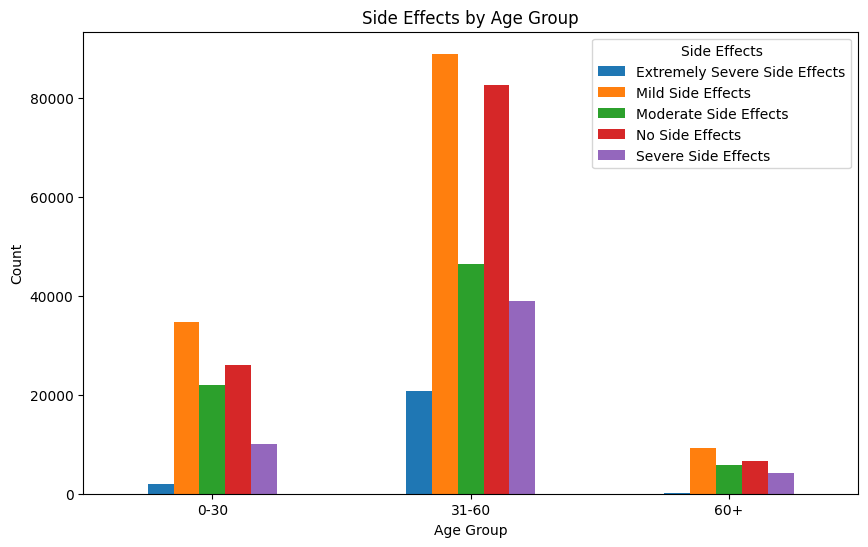

In [100]:

# Plot the contingency table as a bar plot
ax = contingency_table.plot(kind='bar', figsize=(10, 6))

# Set labels and title
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.title('Side Effects by Age Group')

# Display the legend
plt.legend(title='Side Effects', loc='upper right')

# Rotate x-axis labels for better readability
plt.xticks(rotation=0)

# Show the plot
plt.show()

In [101]:
#Severity Trends: Across all age groups, "Mild Side Effects" are consistently the most reported, followed by "Moderate Side Effects." However, the prevalence of "Severe Side Effects" and "Extremely Severe Side Effects" tends to increase with age, with the 60+ age group having a relatively higher proportion of these severe side effects.

In [102]:
#RACE VS SIDE EFFECTS

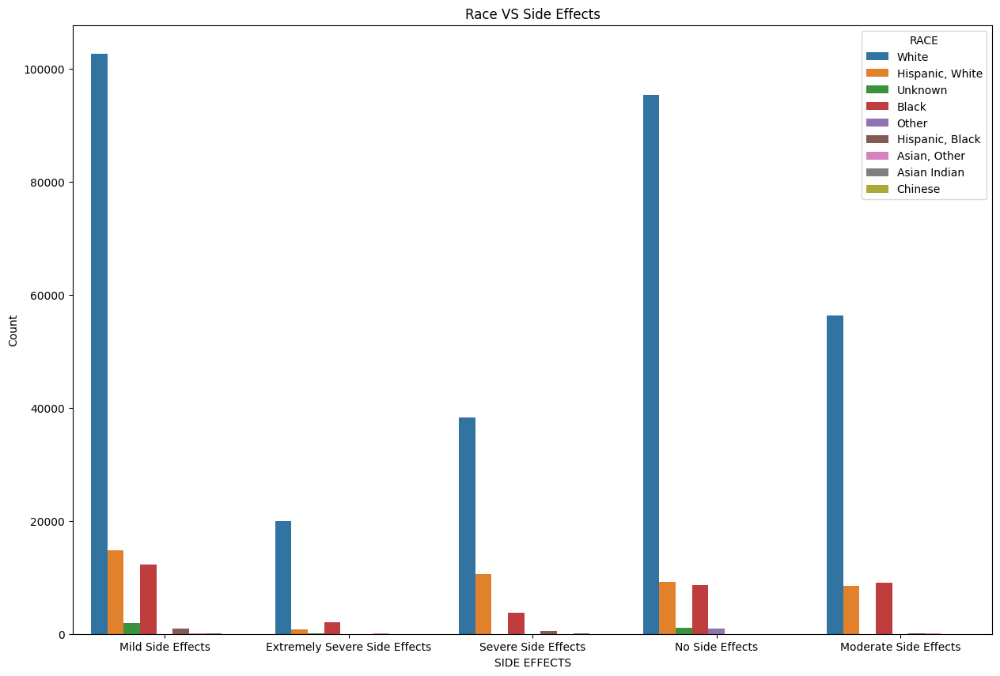

In [103]:
plt.figure(figsize=(15, 10))
sns.countplot(x='SIDE EFFECTS', hue='RACE', data=data)
plt.xlabel('SIDE EFFECTS')
plt.ylabel('Count')
plt.title('Race VS Side Effects')
plt.show()


In [104]:
#BLACKS  ARE SHOWING EXTREME SEVERE SIDE EFFECTS COMPARED TO HISPANIC WHITE ,BLACKS ARE SHOWING MODERATE SIDE EFFECTS A BIT HIGHER COMPARED TO HISPANIC WHITE

**MULTIVARIATE ANALYSIS**

In [105]:
# DRUG NAME VS GENDER VS AGE

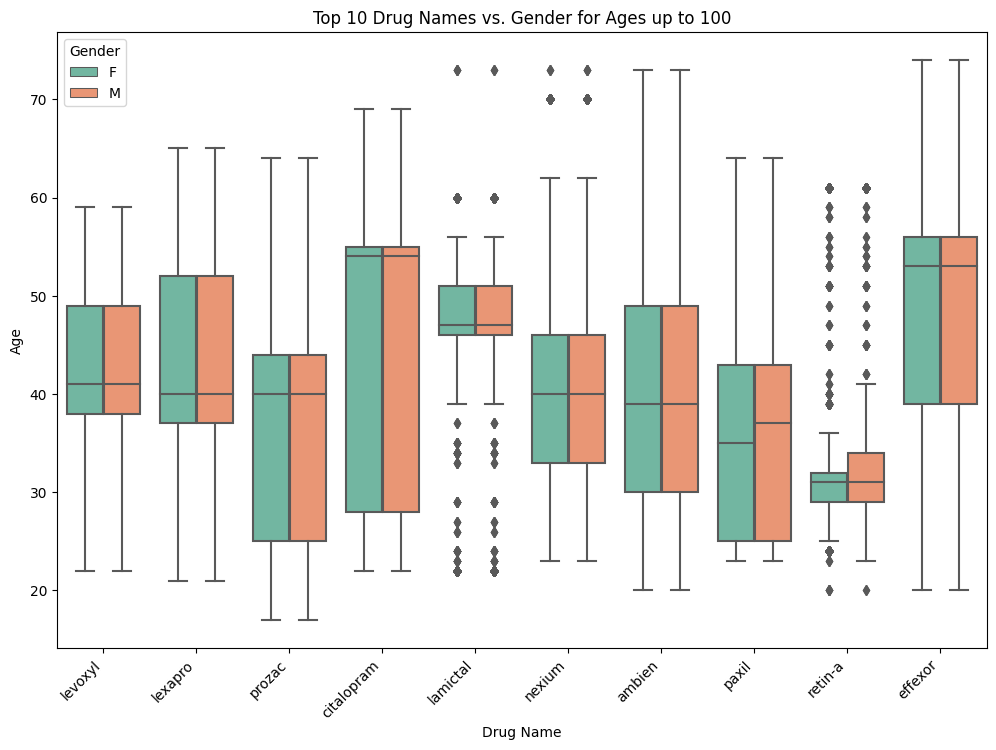

In [106]:
# Filter the data to include ages up to 100
filtered_data = data[data['AGE'] <= 100]

# Get the top 10 drug names from the filtered data
top_n = 10
top_drugs = filtered_data['DRUG NAME'].value_counts().head(top_n).index

# Filter the data again to include only the top 10 drug names
filtered_data = filtered_data[filtered_data['DRUG NAME'].isin(top_drugs)]

# Create a box plot for the top 10 drug names vs. gender for ages up to 100
plt.figure(figsize=(12, 8))
sns.boxplot(x='DRUG NAME', y='AGE', hue='GENDER', data=filtered_data, palette='Set2')
plt.xlabel('Drug Name')
plt.ylabel('Age')
plt.title(f'Top {top_n} Drug Names vs. Gender for Ages up to 100')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Gender')
plt.show()
   #age vs drug name vs side effect try this

In [107]:
#younger patients are having skin concerns(retin-a)(males are higher than females ), older patients are suffering from depression irrespective of gender

# DATA PREPROCESSING

# Filling Missing Values

In [108]:
data.isna().sum()

GENDER           0
DRUG NAME        0
AGE             20
RACE             0
SIDE EFFECTS     0
dtype: int64

In [109]:
print("Percentage of missing values in each column:")
print(100 * data.isnull().sum() / len(data))     #dividing the count of missing values by the total number of rows and then multiplying by 100.

Percentage of missing values in each column:
GENDER          0.000000
DRUG NAME       0.000000
AGE             0.005023
RACE            0.000000
SIDE EFFECTS    0.000000
dtype: float64


In [110]:
data['AGE'].median()# Filling it with median as the histogram shows skewed distribution.

41.0

In [111]:
data['AGE']  = data['AGE'].fillna(data['AGE'].median())

In [112]:
data.isna().sum()

GENDER          0
DRUG NAME       0
AGE             0
RACE            0
SIDE EFFECTS    0
dtype: int64

# Outliers

In [113]:
data.dtypes

GENDER           object
DRUG NAME        object
AGE             float64
RACE             object
SIDE EFFECTS     object
dtype: object

Text(0.5, 1.0, 'Boxplot for age')

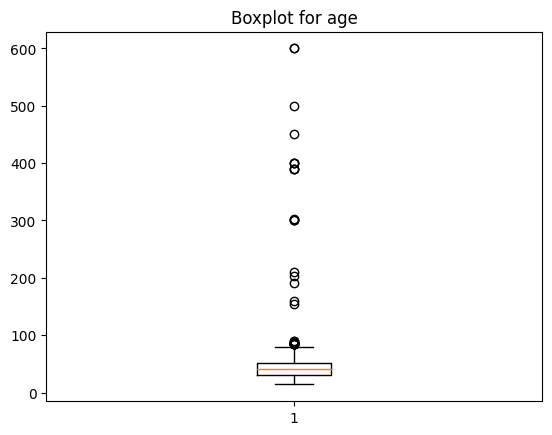

In [114]:
plt.boxplot(data['AGE'])
plt.title('Boxplot for age')

In [115]:
q1 = np.percentile(data['AGE'], 25)
q2 = np.percentile(data['AGE'], 50)
q3 = np.percentile(data['AGE'], 75)
iqr=q3-q1
low_limit = q1 - 1.5*iqr
upr_limit = q3 + 1.5*iqr
low_limit
upr_limit
outlier=[]
for x in data['AGE']:
    if x>upr_limit or x<low_limit:
        outlier.append(x)

In [116]:
outlier

[300.0,
 302.0,
 87.0,
 90.0,
 84.0,
 500.0,
 400.0,
 87.0,
 203.0,
 160.0,
 400.0,
 87.0,
 87.0,
 191.0,
 450.0,
 390.0,
 84.0,
 87.0,
 84.0,
 155.0,
 300.0,
 87.0,
 87.0,
 84.0,
 390.0,
 87.0,
 84.0,
 600.0,
 84.0,
 84.0,
 87.0,
 84.0,
 211.0,
 600.0,
 401.0,
 89.0,
 300.0,
 390.0]

In [117]:
ind1 = data['AGE']>upr_limit
data.loc[ind1].index

Int64Index([  3008,  41048,  43016,  52650,  60136,  66169,  85047,  93226,
            111850, 119574, 127240, 145846, 168426, 171643, 174039, 174487,
            186893, 209780, 218988, 224733, 232518, 242302, 245321, 259034,
            264849, 266215, 275520, 290165, 295943, 300452, 315506, 325628,
            325631, 333669, 337790, 363934, 384352, 393820],
           dtype='int64')

In [118]:
# No lower outliers

In [119]:
# Drop rows with 'AGE' values above 100
data = data[data['AGE'] <= 100]

# Now, 'data' will contain only rows where 'AGE' is 100 or below


In [120]:
data['AGE'].value_counts()

55.0    15493
37.0    14307
29.0    13671
24.0    13640
41.0    12945
50.0    12599
35.0    12514
36.0    12488
51.0    12453
43.0    11496
38.0    11408
44.0    11237
54.0    11165
26.0    10481
28.0    10399
40.0    10079
52.0    10058
47.0     9304
56.0     9300
48.0     9289
33.0     8939
23.0     8486
45.0     8192
25.0     8165
53.0     7972
27.0     7567
31.0     7322
39.0     7130
22.0     7101
49.0     7100
32.0     6985
34.0     6872
46.0     6736
42.0     6648
60.0     6276
30.0     5977
62.0     5224
58.0     5020
65.0     4989
57.0     4175
64.0     4032
61.0     3308
63.0     2696
20.0     2683
18.0     2459
21.0     2282
59.0     2128
70.0     1945
66.0     1128
69.0     1056
71.0     1017
17.0      986
15.0      516
19.0      272
67.0      218
72.0       96
75.0       48
68.0       48
73.0       32
87.0        9
74.0        8
14.0        8
84.0        8
90.0        1
80.0        1
77.0        1
89.0        1
Name: AGE, dtype: int64

In [121]:
data.shape

(398189, 5)

# Encoding

In [122]:
# As the dataset is large, I am considering Label encoding

In [123]:
label_columns = ['GENDER','RACE','DRUG NAME','SIDE EFFECTS']

Label Encoding

In [124]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for column in label_columns:
    data[column] = le.fit_transform(data[column])

<ipython-input-124-a4480c16519a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[column] = le.fit_transform(data[column])
<ipython-input-124-a4480c16519a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[column] = le.fit_transform(data[column])
<ipython-input-124-a4480c16519a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

In [125]:
data['GENDER']

0         1
1         1
2         0
3         0
4         1
5         0
6         0
7         0
8         1
9         1
10        0
11        1
12        0
13        0
14        0
15        0
16        0
17        0
18        1
19        1
20        1
21        1
22        1
23        1
24        1
25        1
26        0
27        0
28        1
29        0
30        0
31        1
32        1
33        1
34        0
35        1
36        1
37        1
38        1
39        1
40        0
41        1
42        1
43        0
44        0
45        1
46        1
47        0
48        1
49        1
50        0
51        0
52        0
53        0
54        1
55        1
56        0
57        0
58        0
59        0
60        0
61        1
62        0
63        1
64        1
65        1
66        1
67        1
68        0
69        0
70        1
71        1
72        1
73        1
74        0
75        0
76        1
77        1
78        1
79        1
80        1
81        1
82        0
83  

# Correlation

<function matplotlib.pyplot.show(close=None, block=None)>

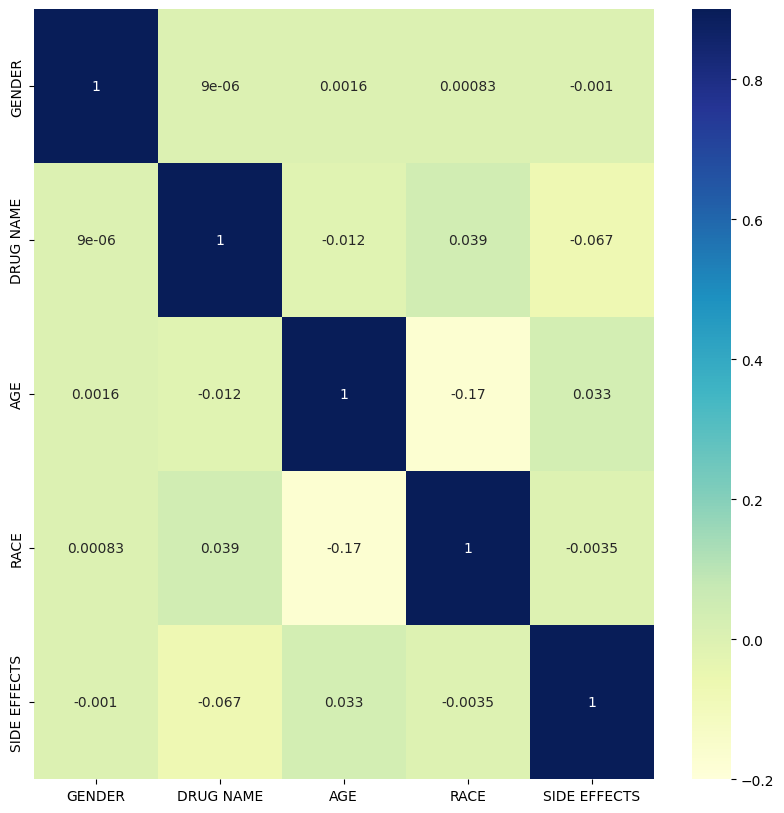

In [126]:
plt.figure(figsize=(10,10))
corr_matrix=data.corr()
sns.heatmap(corr_matrix,vmin=-0.2,vmax=0.9,annot=True,cmap='YlGnBu')
plt.show

In [127]:
# No correlation between any features. So I am not dropping anything.

# Scaling

In [128]:
# I am not doing scaling because scaling has to be done on continuous numerical columns. But in my dataset all are discrete.

# Train Test Splitting

In [129]:
X=data.drop('SIDE EFFECTS',axis=1)
y=data['SIDE EFFECTS']

In [130]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=42)

In [131]:
print("X_train dataset: ", X_train.shape)
print("y_train dataset: ", y_train.shape)
print("X_test dataset: ", X_test.shape)
print("y_test dataset: ", y_test.shape)

X_train dataset:  (298641, 4)
y_train dataset:  (298641,)
X_test dataset:  (99548, 4)
y_test dataset:  (99548,)


# Model Selection Based on Metrics

In [132]:
# I am Considering models which are not effected by the magnitude difference in each features.

In [133]:
# DECISION TREE

In [134]:
data['SIDE EFFECTS'].value_counts()# multiclass classification

1    132665
3    115245
2     74162
4     53187
0     22930
Name: SIDE EFFECTS, dtype: int64

In [135]:
data['SIDE EFFECTS'].value_counts(normalize=True)

1    0.333171
3    0.289423
2    0.186248
4    0.133572
0    0.057586
Name: SIDE EFFECTS, dtype: float64

In [136]:
# It is an imbalanced dataset, so I am considering other metrics rather than accuracy

In [137]:
from sklearn.tree import DecisionTreeClassifier
dt_clf=DecisionTreeClassifier()
dt_clf.fit(X_train,y_train)

DecisionTreeClassifier()

In [138]:
y_pred=dt_clf.predict(X_test)

In [139]:
from sklearn.metrics import accuracy_score, confusion_matrix,precision_score,recall_score,f1_score
print('Accuracy = ',accuracy_score(y_test,y_pred))
print('Precision = ',precision_score(y_test,y_pred,average='weighted'))
print('Recall = ',recall_score(y_test,y_pred,average='weighted'))
print('F1 Score = ',f1_score(y_test,y_pred,average='weighted'))

Accuracy =  0.9863985213163499
Precision =  0.9864405884238486
Recall =  0.9863985213163499
F1 Score =  0.9863622857744598


In [140]:
# Random Forest

In [141]:
from sklearn.ensemble import RandomForestClassifier
rf_clf=RandomForestClassifier()
rf_clf.fit(X_train,y_train)

RandomForestClassifier()

In [142]:
y_pred=rf_clf.predict(X_test)

In [143]:
print('Accuracy = ',accuracy_score(y_test,y_pred))
print('Precision = ',precision_score(y_test,y_pred,average='weighted'))
print('Recall = ',recall_score(y_test,y_pred,average='weighted'))
print('F1 Score = ',f1_score(y_test,y_pred,average='weighted'))

Accuracy =  0.9857154337605979
Precision =  0.985731850848834
Recall =  0.9857154337605979
F1 Score =  0.9856838537292851


In [144]:
# GBM

In [145]:
from sklearn.ensemble import GradientBoostingClassifier


# Initialize the Gradient Boosting classifier
gbm_clf = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)

# Train the classifier
gbm_clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = gbm_clf.predict(X_test)

In [146]:
print('Accuracy = ',accuracy_score(y_test,y_pred))
print('Precision = ',precision_score(y_test,y_pred,average='weighted'))
print('Recall = ',recall_score(y_test,y_pred,average='weighted'))
print('F1 Score = ',f1_score(y_test,y_pred,average='weighted'))

Accuracy =  0.80629445091815
Precision =  0.8162833796216451
Recall =  0.80629445091815
F1 Score =  0.8052327338130272


In [147]:
# Naive Bayes

In [148]:
from sklearn.naive_bayes import GaussianNB

# Create a Gaussian Naive Bayes classifier
nb_clf = GaussianNB()

# Fit the Naive Bayes classifier to the training data
nb_clf.fit(X_train, y_train)

# Predict using the Naive Bayes classifier
y_pred = nb_clf.predict(X_test)

In [149]:
print('Accuracy = ',accuracy_score(y_test,y_pred))
print('Precision = ',precision_score(y_test,y_pred,average='weighted'))
print('Recall = ',recall_score(y_test,y_pred,average='weighted'))
print('F1 Score = ',f1_score(y_test,y_pred,average='weighted'))

Accuracy =  0.34171454976493754
Precision =  0.26595736489947286
Recall =  0.34171454976493754
F1 Score =  0.2821504728244714


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [150]:
# Decision Tree is considerind as the best model because all the metrics(not considering accuracy as the dataset is an imbalanced one) are more in it.

**CROSS VALIDATION**

In [151]:
from sklearn.model_selection import StratifiedKFold
# Initialize the StratifiedKFold object
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Lists to store precision, recall, and F1 scores for each fold
precision_scores_dt = []
recall_scores_dt = []
f1_scores_dt = []

# Perform cross-validation
for train_index, test_index in stratified_kfold.split(X, y):
    X_train_cv, X_test_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_cv, y_test_cv = y.iloc[train_index], y.iloc[test_index]

    # Initialize the Decision Tree classifier
    dt_classifier = DecisionTreeClassifier(random_state=42)

    # Fit the classifier on the training data
    dt_classifier.fit(X_train_cv, y_train_cv)

    # Predict on the test data
    y_pred_cv = dt_classifier.predict(X_test_cv)

    # Calculate precision, recall, and F1 scores
    precision = precision_score(y_test_cv, y_pred_cv,average='weighted')
    recall = recall_score(y_test_cv, y_pred_cv,average='weighted')
    f1 = f1_score(y_test_cv, y_pred_cv,average='weighted')

    precision_scores_dt.append(precision)
    recall_scores_dt.append(recall)
    f1_scores_dt.append(f1)

# Calculate and print the mean precision, recall, and F1 scores across all folds
mean_precision = sum(precision_scores_dt) / len(precision_scores_dt)
mean_recall = sum(recall_scores_dt) / len(recall_scores_dt)
mean_f1 = sum(f1_scores_dt) / len(f1_scores_dt)

print("Mean Precision:", mean_precision)
print("Mean Recall:", mean_recall)
print("Mean F1 Score:", mean_f1)

Mean Precision: 0.9863593616546146
Mean Recall: 0.986323077582729
Mean F1 Score: 0.9863195530972095


HYPERPARAMETER TUNING

In [152]:
from sklearn.model_selection import RandomizedSearchCV

# Define the hyperparameter grid for Decision Tree
dt_params = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2','auto'],
    'random_state': [None, 42],
}

# Create a Decision Tree classifier
dt_model = DecisionTreeClassifier()

# Initialize RandomizedSearchCV
cv_model_dt = RandomizedSearchCV(estimator=dt_model, param_distributions=dt_params,
                                 scoring='f1_weighted', n_jobs=-1, return_train_score=True,
                                 cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42))

# Fit the randomized search to your training data
cv_model_dt.fit(X_train_cv, y_train_cv)

# Get the best hyperparameters for Decision Tree
best_params_dt = cv_model_dt.best_params_

# Print the best parameters
print("Best Parameters for Decision Tree (F1 Weighted Score):", best_params_dt)


Best Parameters for Decision Tree (F1 Weighted Score): {'splitter': 'random', 'random_state': 42, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 50, 'criterion': 'entropy'}


In [153]:
# Use the best hyperparameters obtained from RandomizedSearchCV
best_params_dt = {
    'splitter': 'random',
    'random_state': None,
    'min_samples_split': 10,
    'min_samples_leaf': 1,
    'max_features': None,
    'max_depth': 50,
    'criterion': 'entropy'
}

# Create a new Decision Tree classifier with the best hyperparameters
best_dt_model = DecisionTreeClassifier(**best_params_dt)

# Fit the model to your training data
best_dt_model.fit(X_train_cv, y_train_cv)

# Predict on the test data
y_pred_dt = best_dt_model.predict(X_test_cv)

# Calculate precision, recall, and F1-score
precision_dt = precision_score(y_test_cv, y_pred_dt, average='weighted')
recall_dt = recall_score(y_test_cv, y_pred_dt, average='weighted')
f1_dt = f1_score(y_test_cv, y_pred_dt, average='weighted')

# Print the evaluation metrics
print("Precision (Decision Tree):", precision_dt)
print("Recall (Decision Tree):", recall_dt)
print("F1 Score (Decision Tree):", f1_dt)


Precision (Decision Tree): 0.9857051938058171
Recall (Decision Tree): 0.9856724889184676
F1 Score (Decision Tree): 0.9856753929905597
